<a href="https://colab.research.google.com/github/nthnlgmz/Finals/blob/main/finalsFaceRecognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/nthnlgmz/Finals.git
%cd Images
!pip install face_recognition
%cd face_recognition

Cloning into 'Finals'...
remote: Enumerating objects: 88, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 88 (delta 15), reused 4 (delta 4), pack-reused 66
Receiving objects: 100% (88/88), 10.87 MiB | 11.02 MiB/s, done.
Resolving deltas: 100% (27/27), done.
[Errno 2] No such file or directory: 'Images'
/content
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.1/100.1 MB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566170 sha256=c42436865fa8c3ed63fae41147d8c749e2c64ecad9f9e6fd925495fc533d4571
  Stored in directory: /root/.cache/pip/wheels/7a/eb/cf/e9eced74122b679557f597bb7c8e4c739cfcac526db1fd523d
Successfully built face-recognition-models
[Errno 2] No such file or directory: 'face_recognition'
/content


In [ ]:
import face_recognition
import numpy as np
from google.colab.patches import cv2_imshow
import cv2

# Creating the encoding profiles
# Face 1
face_1 = face_recognition.load_image_file("/content/Finals/Images/Lionel_Messi.webp")
face_1_encoding = face_recognition.face_encodings(face_1)[0]

# Face 2
face_2 = face_recognition.load_image_file("/content/Finals/Images/Neymar_Jr.webp")
face_2_encoding = face_recognition.face_encodings(face_2)[0]

# Face 3
face_3 = face_recognition.load_image_file("/content/Finals/Images/ChristianoRonaldo.jpg")
face_3_encoding = face_recognition.face_encodings(face_3)[0]

# Face 4
face_4 = face_recognition.load_image_file("/content/Finals/Images/L Suarez.webp")
face_4_encoding = face_recognition.face_encodings(face_4)[0]

# Face 5
face_5 = face_recognition.load_image_file("/content/Finals/Images/Sergio Ramos.png")
face_5_encoding = face_recognition.face_encodings(face_5)[0]

# Known face encodings
known_face_encodings = [
    face_1_encoding,
    face_2_encoding,
    face_3_encoding,
    face_4_encoding,
    face_5_encoding
]

# Known face names
known_face_names = [
    "Lionel Messi",
    "Neymar Jr.",
    "Christiano Ronaldo",
    "Luis Suárez",
    "Sergio Ramos"
]


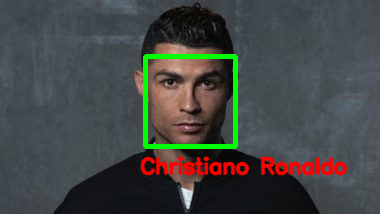

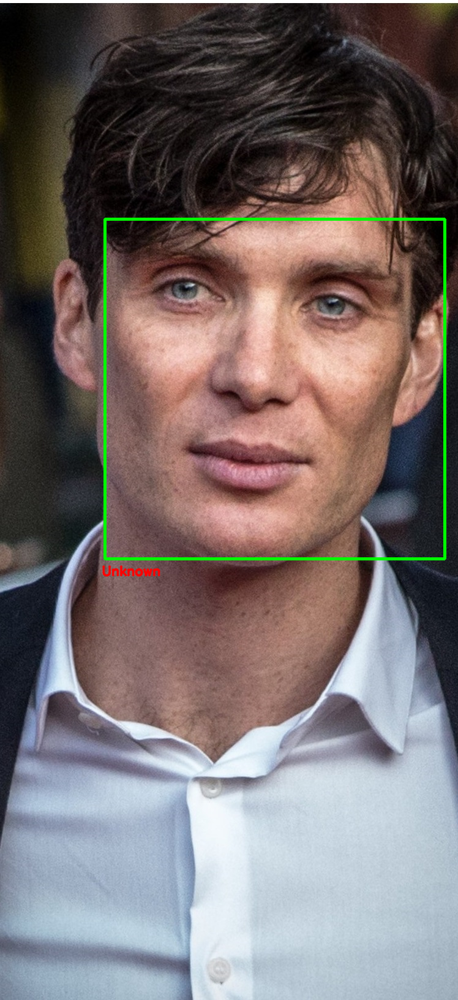

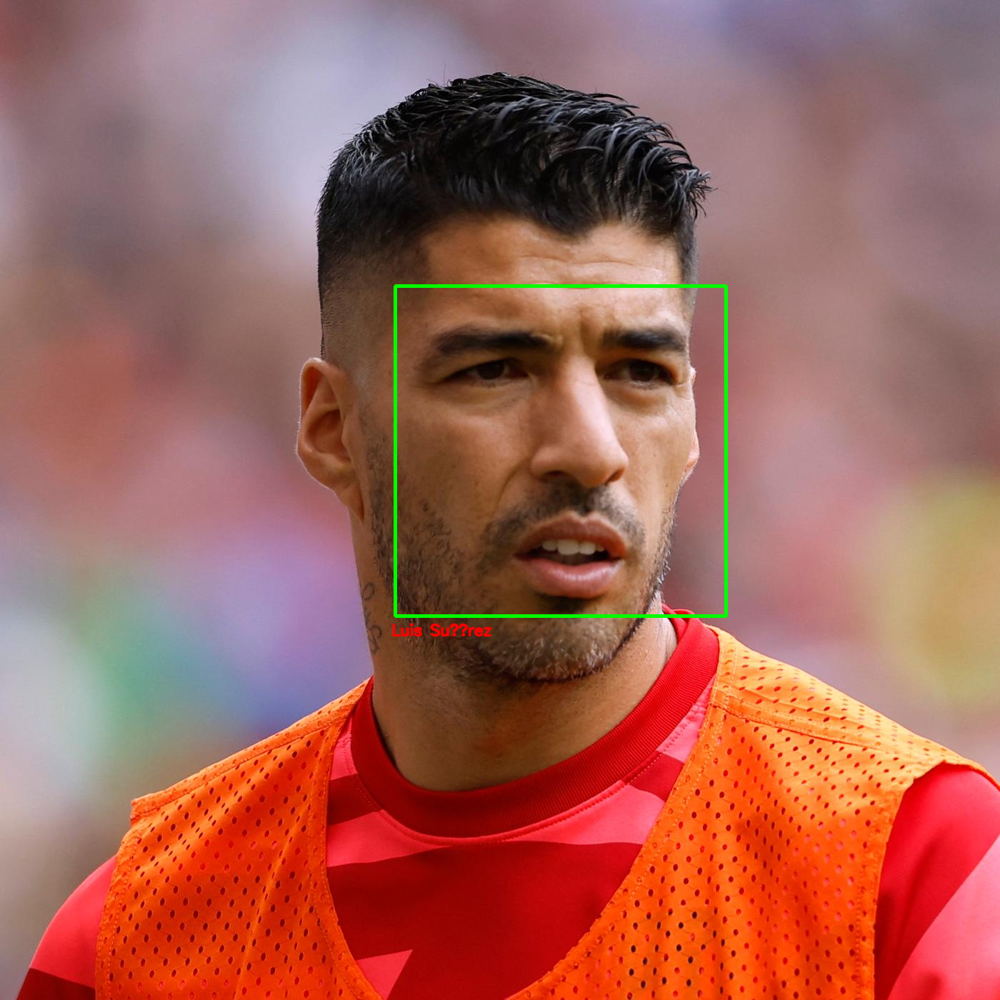

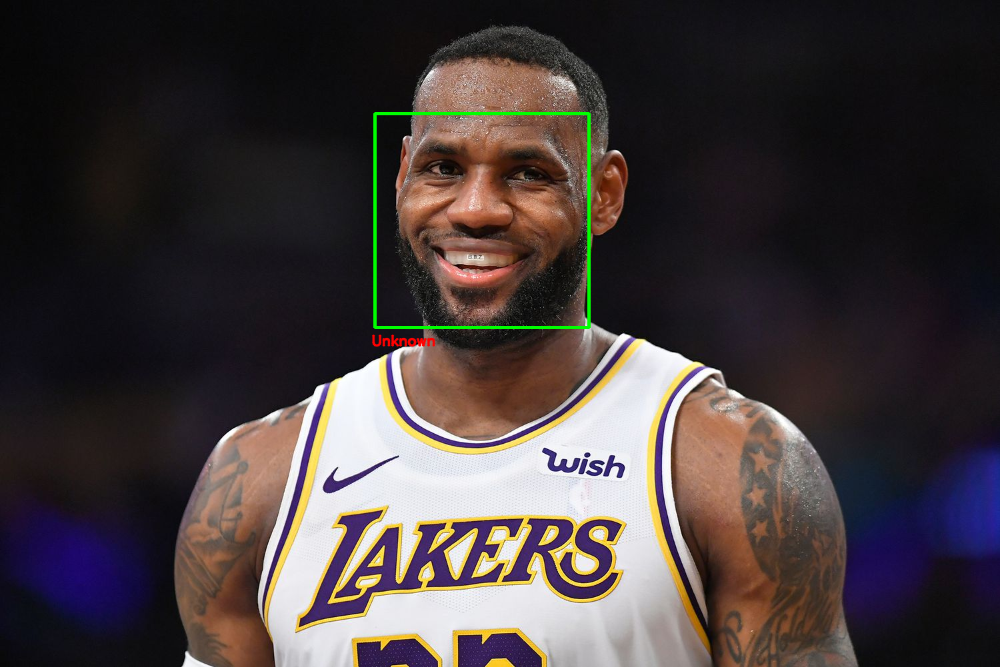

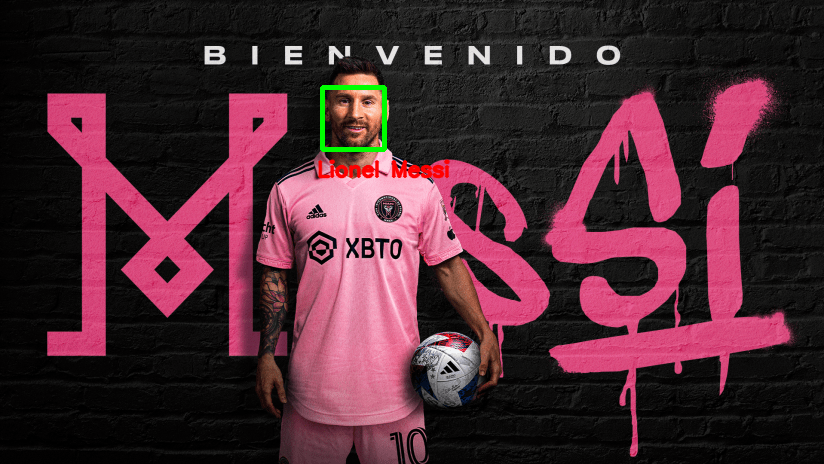

...

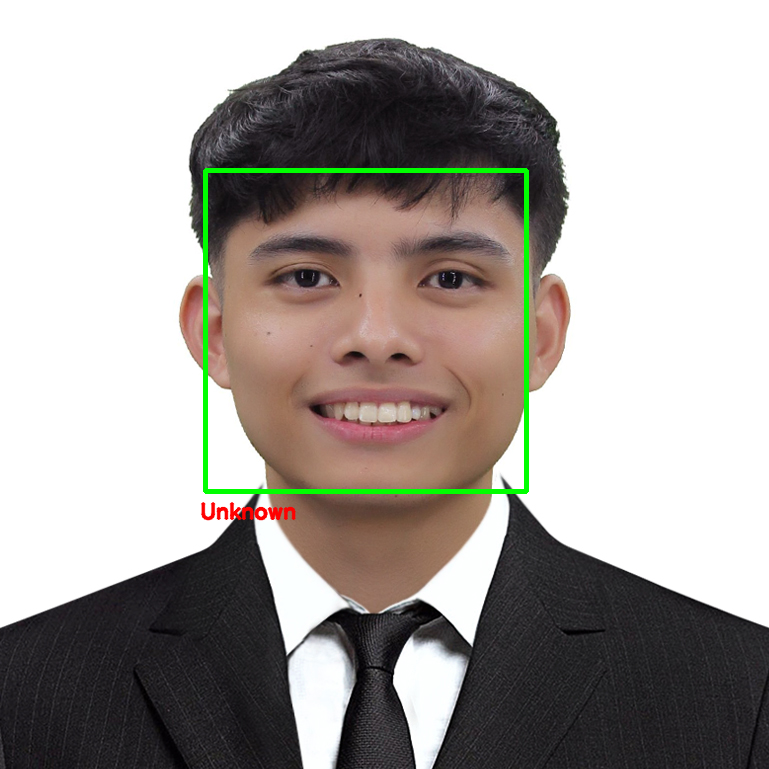

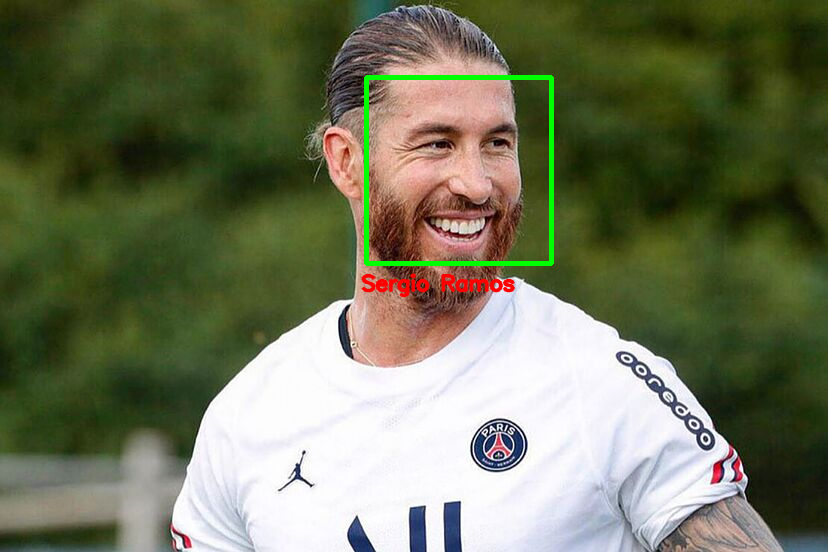

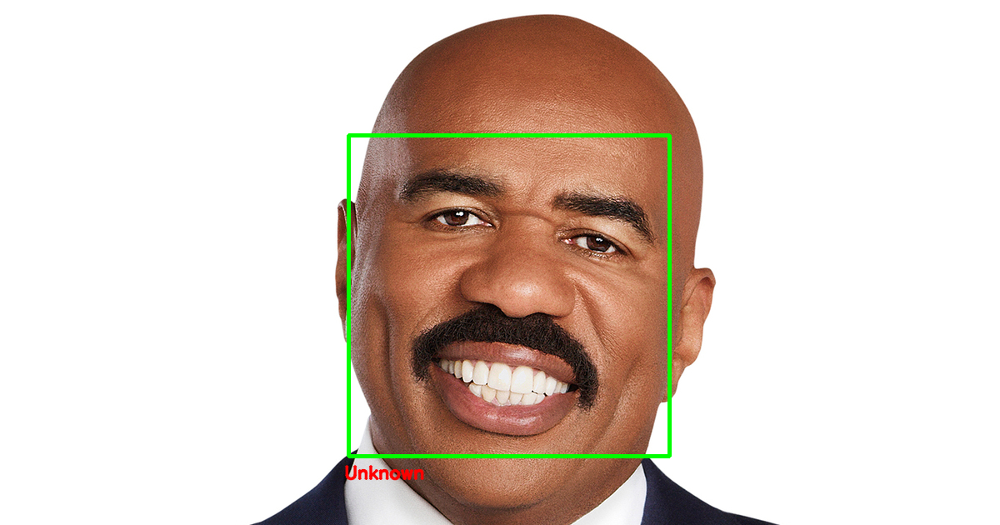

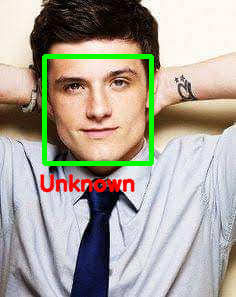

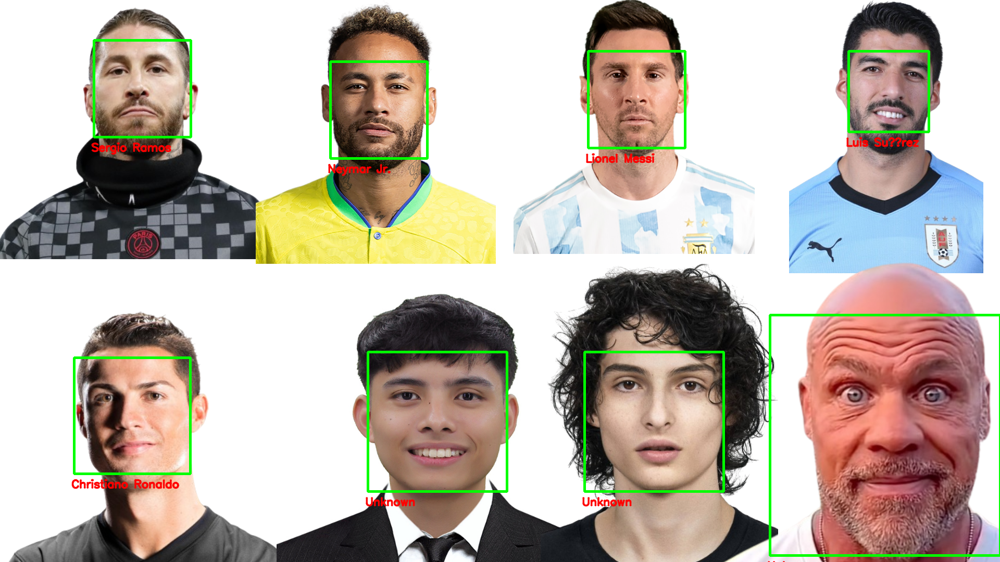

In [ ]:
file_names = ["/content/Finals/Images/ChristianoRonaldo(1).jpg", "/content/Finals/Images/Cillian Murphy.jpg", "/content/Finals/Images/L Suarez(1).jpg", "/content/Finals/Images/LEBRON.jpg", "/content/Finals/Images/Lionel_Messi(1).png", "/content/Finals/Images/M&M.jpg", "/content/Finals/Images/Neymar_Jr(1).webp", "/content/Finals/Images/Ralph Gabriel Mendoza.JPG", "/content/Finals/Images/Sergio Ramos(1).jpg", "/content/Finals/Images/Steve Harvey.jpg", "/content/Finals/Images/whistle.jpg", "/content/Finals/Images/Compilation of faces.png"]

for file_name in file_names:
    unknown_image = face_recognition.load_image_file(file_name)
    unknown_image_to_draw = cv2.imread(file_name)

    face_locations = face_recognition.face_locations(unknown_image)
    face_encodings = face_recognition.face_encodings(unknown_image, face_locations)

    for (top, right, bottom, left), face_encoding in zip(face_locations, face_encodings):
        matches = face_recognition.compare_faces(known_face_encodings, face_encoding)

        name = "Unknown"

        face_distances = face_recognition.face_distance(known_face_encodings, face_encoding)
        best_match_index = np.argmin(face_distances)
        if matches[best_match_index]:
            name = known_face_names[best_match_index]

        font_size = .7
        cv2.rectangle(unknown_image_to_draw, (left, top), (right, bottom), (0, 255, 0), 3)
        cv2.putText(unknown_image_to_draw, name, (left - 5, bottom + 27), cv2.FONT_HERSHEY_SIMPLEX, font_size, (0, 0, 255), 2, cv2.LINE_AA)

    cv2_imshow(unknown_image_to_draw)
